In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from pyathena.tigress_ncr.ncr_paper_lowz import LowZData
import os

from pyathena.tigress_ncr.phase import assign_phase
# from pyathena.tigress_ncr.cooling_breakdown import *
from pyathena.plt_tools.plt_starpar import scatter_sp
from pyathena.tigress_ncr.ncr_paper_lowz import athena_data
from pyathena.tigress_ncr.snapshots import set_my_dfi, set_axis_color, Plabels

[stellar-intel.princeton.edu:2065593] mca_base_component_repository_open: unable to open mca_op_avx: /usr/local/openmpi/4.1.0/gcc/lib64/openmpi/mca_op_avx.so: undefined symbol: ompi_op_base_module_t_class (ignored)


In [2]:
Plabels

{'Ptot': '${P}_{\\rm tot}$',
 'Pth': '${P}_{\\rm th}$',
 'Pturb': '${P}_{\\rm turb}$',
 'Pmag': '${P}_{\\rm mag}$',
 'Pimag': '${\\Pi}_{\\rm mag}$',
 'dPimag': '${\\Pi}_{\\delta B}$',
 'oPimag': '${\\Pi}_{\\overline{B}}$',
 'W': '$\\mathcal{W}$',
 'Wext': '$\\mathcal{W}_{\\rm ext}$',
 'Wsg': '$\\mathcal{W}_{\\rm sg}$',
 'PDE': '$P_{\\rm DE}$',
 'Prad': '$\\Delta P_{\\rm rad}$'}

In [3]:
plt.style.use('ncr-paper.mplstyle')
# for imshow
plt.rcParams['axes.grid']=False
plt.rcParams['image.interpolation']='nearest'
plt.rcParams['ytick.direction']='out'
plt.rcParams['ytick.minor.visible']=False
plt.rcParams['xtick.direction']='out'
plt.rcParams['xtick.minor.visible']=False

In [4]:
pdata = LowZData()

LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy2048.eps0.0.
LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b10.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0.
LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0.
LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0.
LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0.
LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b1.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0.
LoadSimTIGRESSNCR-WARNING: rst files not found in /scratch/gpfs/changgoo/TIGRESS-NCR/R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0.
LoadSimTIGRESSNCR-WARNING: rs

R8-S30 R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps0.0
R8-S30 R8_8pc_NCR_S30.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps0.0
R8-b10 R8_8pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy2048.eps0.0
R8-b10 R8_8pc_NCR.full.b10.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0
R8-b10 R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0
R8-b10 R8_8pc_NCR.full.b10.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0
R8-b1 R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0
R8-b1 R8_8pc_NCR.full.b1.v3.iCR4.Zg0.3.Zd0.3.xy4096.eps0.0
R8-b1 R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0
R8-b1 R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.025.xy4096.eps0.0
LGR8-S05 LGR8_8pc_NCR_S05.full.b10.v3.iCR5.Zg1.Zd1.xy4096.eps0.0
LGR8-S05 LGR8_8pc_NCR_S05.full.b10.v3.iCR5.Zg0.1.Zd0.1.xy8192.eps0.0
LGR4-S100 LGR4_4pc_NCR_S100.full.b1.v3.iCR5.Zg1.Zd1.xy1024.eps1.e-8.rstZ01
LGR4-S100 LGR4_4pc_NCR_S100.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8
LGR4-S100 LGR4_4pc_NCR_S100.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8
LGR4-b10 LGR4_4pc_NCR.full.b10.v3.iCR4.Zg1.Zd1.xy10

In [5]:
pdata.outdir = "../lowZ-figures-paper"
os.makedirs(pdata.outdir, exist_ok=True)

In [6]:
s = pdata.sa.set_model(pdata.mgroup['R8'][-1])
dfi = set_my_dfi(s.dfi)

In [7]:
s.basename

'R8_8pc_NCR.full.b1.v3.iCR4.Zg3.Zd3.xy1024.eps1.e-8'

In [8]:
t=463
tfactor=1
slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))

-0.6238543910364951
22.509580122927826
-21.297654172648553
35.23376323779424
14.727156059308486
-15.867127808517424
-15.498974908481944
-6.120971989631653
-30.934252344071865
10.920726422220469


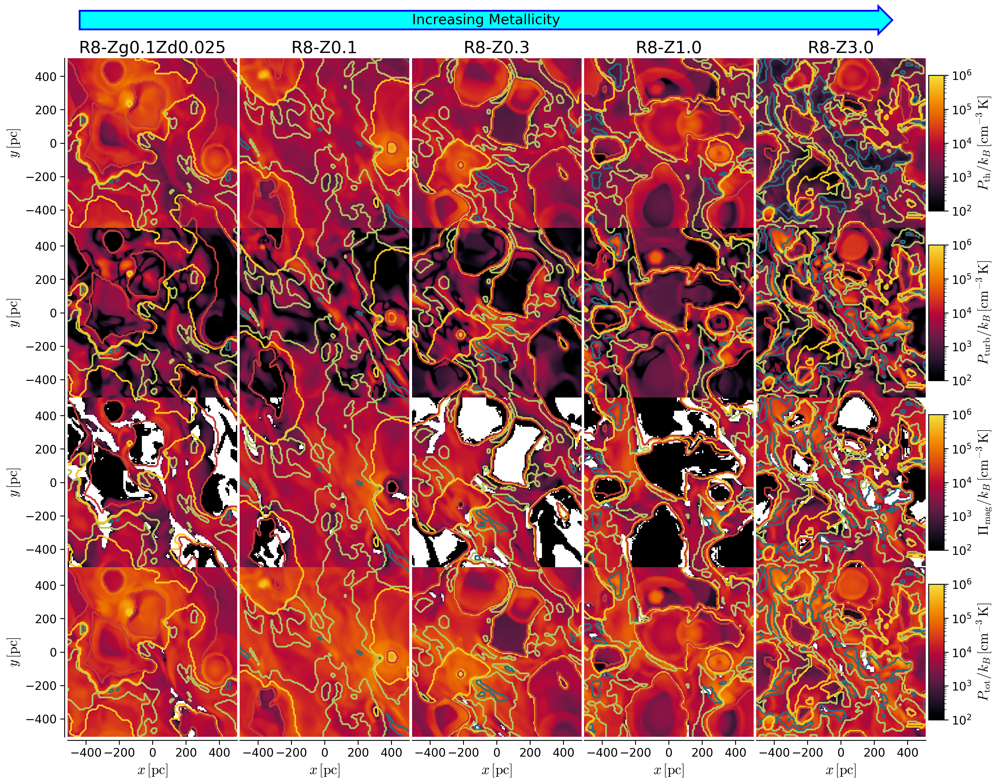

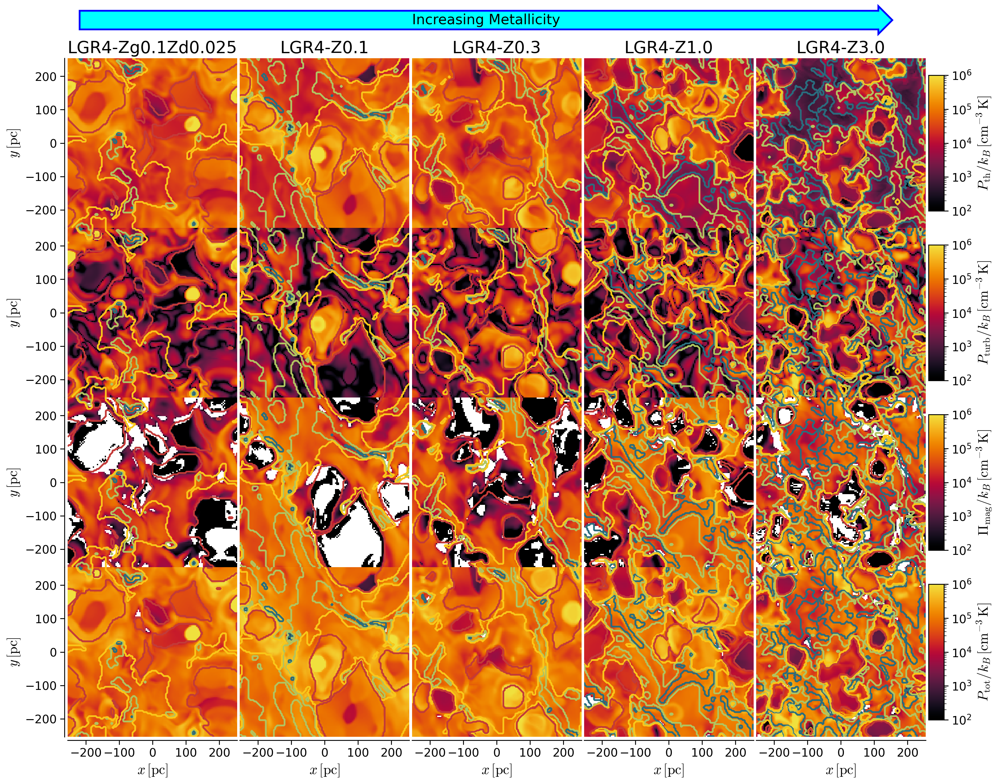

In [10]:
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    dfi['nH']['norm']=LogNorm(1.e-3,1.e2) if mgroup == 'R8' else LogNorm(1.e-2,1.e3)
    dfi['chi_FUV']['norm']=LogNorm(1.e-2,1.e2) if mgroup == 'R8' else LogNorm(1.e-2,1.e3)
    for f in dfi:
        plt_kwargs[f] = dict(norm = dfi[f]['norm'], cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    fields = ['Pth','Pturb','Pimag','Ptot']
    nfields = len(fields)
    fig,axes = plt.subplots(nfields,6,figsize=(18,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,1,1,1,0.1],
                                             wspace=0,hspace=0))

    for i,m,t,axes_ in zip(range(len(mlist)), mlist, tlist[::-1], axes[:,:-1].T):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(sp[sp['mage']<10]['x3'].mean())
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes_, axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            data = assign_phase(s,slcdata,kind='six')
            levels = [0,1,2,3]
            colors = [data.attrs["phdef"][i+1]['c'] for i in levels]
            names =  [data.attrs["phdef"][i]['name'] for i in levels]
            plt.contour(data.x,data.y,data,levels=np.array(levels)+0.5,colors=colors)
            data = slcdata[f]
            im=plt.imshow(data,extent=extent,**plt_kwargs[f])

            if i == (len(mlist)-1):
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=plt_kwargs[f]['label'])
                if f == 'phase':
                    cax.get_yaxis().set_ticks([])
                    for j, lab in enumerate(phlist):
                        color='w' if lab in ['CMM','CNM','UNM','WHIM','HIM'] else 'k'
                        cax.annotate(lab,(0.5,(2*j+1)/(2*nph)), xycoords='axes fraction',color=color,
                                     ha='center', va='center',fontsize=12, weight='bold')
        plt.sca(axes_[0])
        plt.title(s.name)

    tickloc = int(extent[1]/100)*100
    ticks = [-tickloc, 0, tickloc]
    ticks = [-400, -200, 0, 200, 400] if mgroup == 'R8' else [-200,-100,0,100,200]
    for ax in axes[:,0]:
        ax.axis('on')
        set_axis_color(ax,'x','none')
        ax.spines['right'].set_color('none')
        ax.spines['left'].set_position(('axes',-0.02))
        ax.yaxis.tick_left()
        ax.yaxis.set_label_position('left')
        ax.set_yticks(ticks)
        ax.set_ylabel(r'$y\,[{\rm pc}]$')
        # ax.tick_params(axis='y', rotation=20)
    for ax in axes[-1,:-1]:
        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        ax.set_xticks(ticks)
        ax.set_xlabel(r'$x\,[{\rm pc}]$')
        # ax.tick_params(axis='x', rotation=20)
    ax = axes[-1,0]
    set_axis_color(ax,'xy','k')
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')

    # adding arrow
    import matplotlib.patches as mpatches
    ax = axes[0,0]
    bbox_props = dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2)
    arr = mpatches.FancyBboxPatch((0.1,1.2), 4.7, 0.05, mutation_scale=0.1,
                                  transform=ax.transAxes,
                                  clip_on=False,
                                   **bbox_props)
    ax.add_patch(arr)
    ax.annotate("Increasing Metallicity", (.5, .5), xycoords=arr, ha='center', va='center')
    fig.savefig(os.path.join(pdata.outdir,'{}_Pmaps_contours.png'.format(mgroup)),bbox_inches='tight')

-0.6238543910364951
22.509580122927826
-21.297654172648553
35.23376323779424
14.727156059308486
-15.867127808517424
-15.498974908481944
-6.120971989631653
-30.934252344071865
10.920726422220469


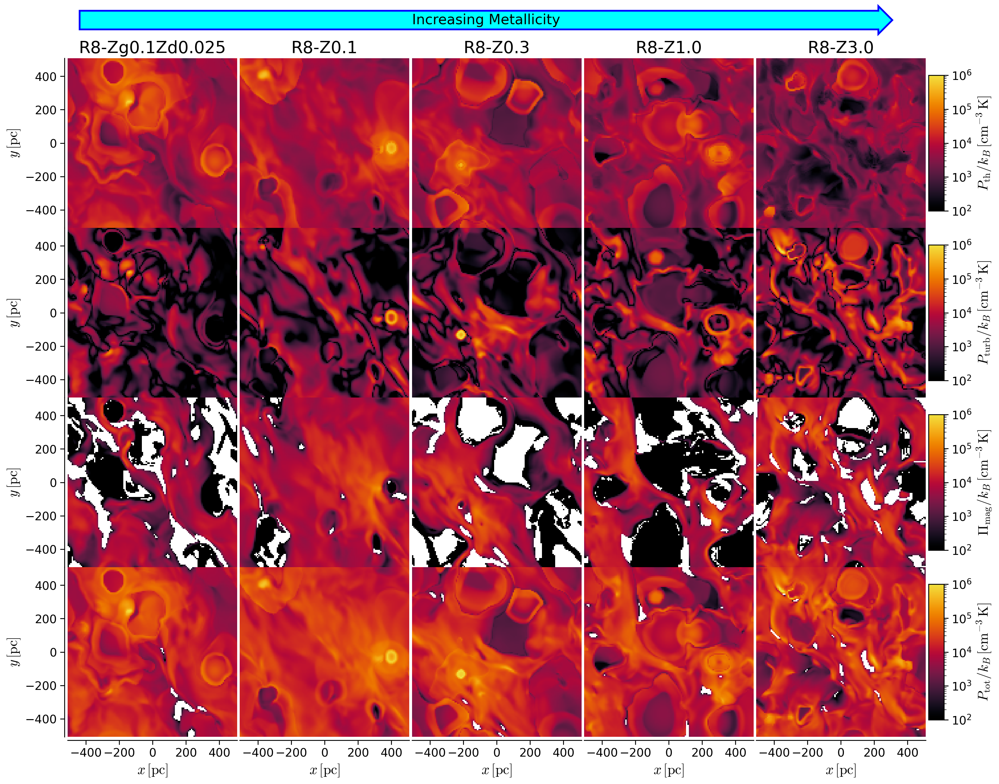

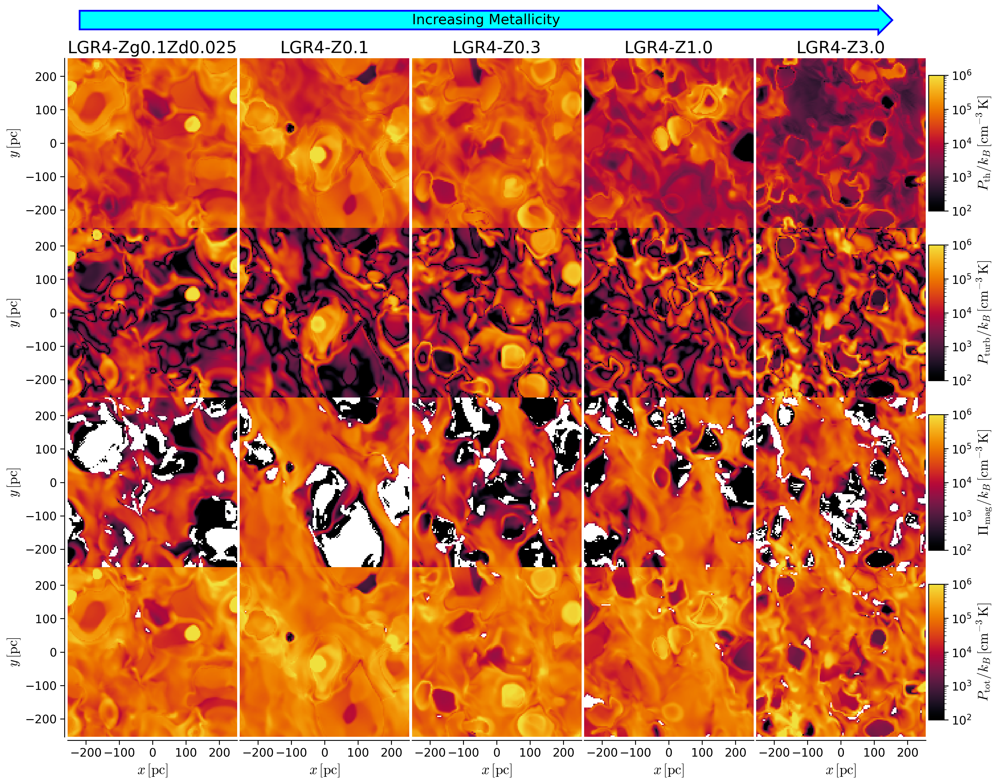

In [11]:
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    dfi['nH']['norm']=LogNorm(1.e-3,1.e2) if mgroup == 'R8' else LogNorm(1.e-2,1.e3)
    dfi['chi_FUV']['norm']=LogNorm(1.e-2,1.e2) if mgroup == 'R8' else LogNorm(1.e-2,1.e3)
    for f in dfi:
        plt_kwargs[f] = dict(norm = dfi[f]['norm'], cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    fields = ['Pth','Pturb','Pimag','Ptot']
    nfields = len(fields)
    fig,axes = plt.subplots(nfields,6,figsize=(18,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,1,1,1,0.1],
                                             wspace=0,hspace=0))

    for i,m,t,axes_ in zip(range(len(mlist)), mlist, tlist[::-1], axes[:,:-1].T):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(sp[sp['mage']<10]['x3'].mean())
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes_, axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            data = assign_phase(s,slcdata,kind='six')
            levels = [0,1,2,3]
            colors = [data.attrs["phdef"][i+1]['c'] for i in levels]
            names =  [data.attrs["phdef"][i]['name'] for i in levels]
            # plt.contour(data.x,data.y,data,levels=np.array(levels)+0.5,colors=colors)
            data = slcdata[f]
            im=plt.imshow(data,extent=extent,**plt_kwargs[f])

            if i == (len(mlist)-1):
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=plt_kwargs[f]['label'])
                if f == 'phase':
                    cax.get_yaxis().set_ticks([])
                    for j, lab in enumerate(phlist):
                        color='w' if lab in ['CMM','CNM','UNM','WHIM','HIM'] else 'k'
                        cax.annotate(lab,(0.5,(2*j+1)/(2*nph)), xycoords='axes fraction',color=color,
                                     ha='center', va='center',fontsize=12, weight='bold')
        plt.sca(axes_[0])
        plt.title(s.name)

    tickloc = int(extent[1]/100)*100
    ticks = [-tickloc, 0, tickloc]
    ticks = [-400, -200, 0, 200, 400] if mgroup == 'R8' else [-200,-100,0,100,200]
    for ax in axes[:,0]:
        ax.axis('on')
        set_axis_color(ax,'x','none')
        ax.spines['right'].set_color('none')
        ax.spines['left'].set_position(('axes',-0.02))
        ax.yaxis.tick_left()
        ax.yaxis.set_label_position('left')
        ax.set_yticks(ticks)
        ax.set_ylabel(r'$y\,[{\rm pc}]$')
        # ax.tick_params(axis='y', rotation=20)
    for ax in axes[-1,:-1]:
        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        ax.set_xticks(ticks)
        ax.set_xlabel(r'$x\,[{\rm pc}]$')
        # ax.tick_params(axis='x', rotation=20)
    ax = axes[-1,0]
    set_axis_color(ax,'xy','k')
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')

    # adding arrow
    import matplotlib.patches as mpatches
    ax = axes[0,0]
    bbox_props = dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2)
    arr = mpatches.FancyBboxPatch((0.1,1.2), 4.7, 0.05, mutation_scale=0.1,
                                  transform=ax.transAxes,
                                  clip_on=False,
                                   **bbox_props)
    ax.add_patch(arr)
    ax.annotate("Increasing Metallicity", (.5, .5), xycoords=arr, ha='center', va='center')
    fig.savefig(os.path.join(pdata.outdir,'{}_Pmaps.png'.format(mgroup)),bbox_inches='tight')

0 R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0 448
1 R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0 387
2 LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8 341
3 LGR4_4pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8 238


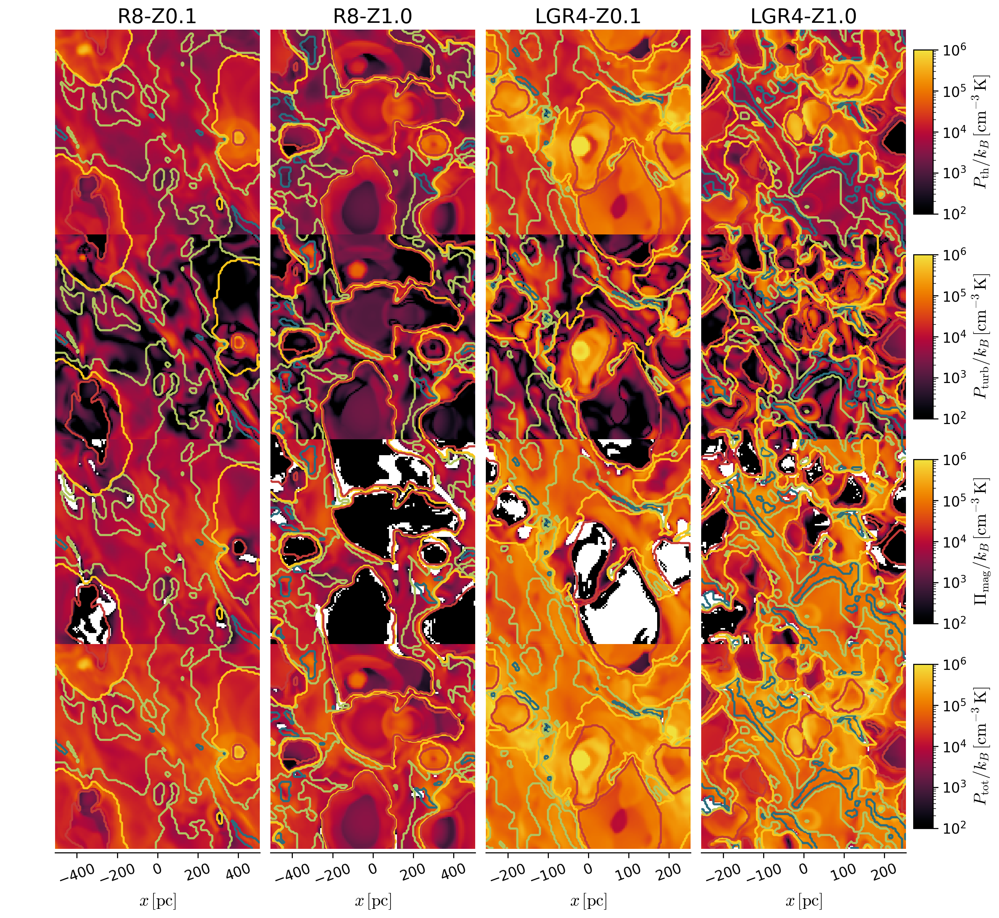

In [53]:
fields = ['Pth','Pturb','Pimag','Ptot']
nfields = len(fields)

fig,axes = plt.subplots(nfields,5,figsize=(15,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,1,1,0.1],
                                             wspace=0,hspace=0))
i=0
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    for f in dfi:
        plt_kwargs[f] = dict(norm = dfi[f]['norm'], cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    for m,t in zip(mlist[1::2], tlist[::-1][1::2]):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(i,m,t)
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes[:,i], axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            data = assign_phase(s,slcdata,kind='six')
            levels = [0,1,2,3]
            colors = [data.attrs["phdef"][i+1]['c'] for i in levels]
            names =  [data.attrs["phdef"][i]['name'] for i in levels]
            plt.contour(data.x,data.y,data,levels=np.array(levels)+0.5,colors=colors)
            data = slcdata[f]
            im=plt.imshow(data,extent=extent,**plt_kwargs[f])

            if i == 3:
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=plt_kwargs[f]['label'])
        plt.sca(axes[0,i])
        plt.title(s.name)
        i+=1

        tickloc = int(extent[1]/100)*100
        ticks = [-tickloc, 0, tickloc]
        ticks = [-400, -200, 0, 200, 400] if mgroup == 'R8' else [-200,-100,0,100,200]

        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        ax.set_xticks(ticks)
        ax.set_xlabel(r'$x\,[{\rm pc}]$')
        ax.tick_params(axis='x', rotation=20)


    # adding arrow
fig.savefig(os.path.join(pdata.outdir,'Pmaps_all_w_cont.png'),bbox_inches='tight')

0 R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0 448
1 R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0 387
2 LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8 341
3 LGR4_4pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8 238


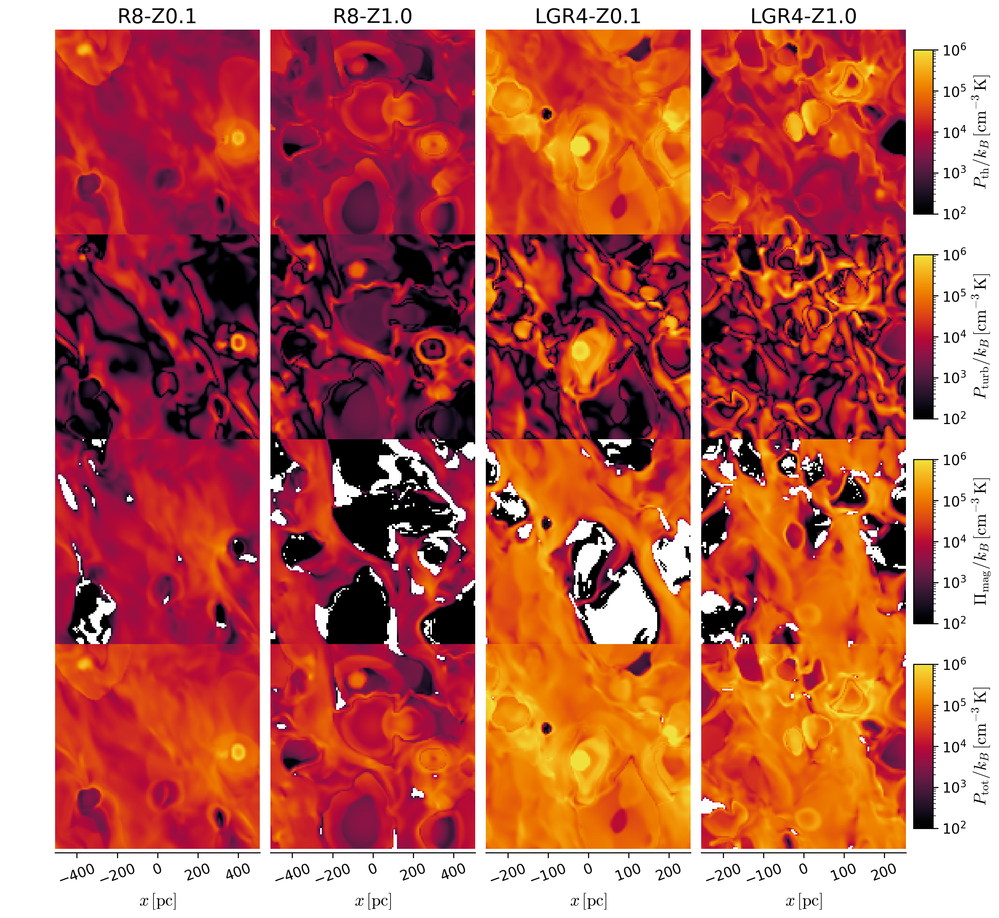

In [54]:
fields = ['Pth','Pturb','Pimag','Ptot']
nfields = len(fields)

fig,axes = plt.subplots(nfields,5,figsize=(15,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,1,1,0.1],
                                             wspace=0,hspace=0))
i=0
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    for f in dfi:
        plt_kwargs[f] = dict(norm = dfi[f]['norm'], cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    for m,t in zip(mlist[1::2], tlist[::-1][1::2]):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(i,m,t)
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes[:,i], axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            data = slcdata[f]
            im=plt.imshow(data,extent=extent,**plt_kwargs[f])

            if i == 3:
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=plt_kwargs[f]['label'])
        plt.sca(axes[0,i])
        plt.title(s.name)
        i+=1

        tickloc = int(extent[1]/100)*100
        ticks = [-tickloc, 0, tickloc]
        ticks = [-400, -200, 0, 200, 400] if mgroup == 'R8' else [-200,-100,0,100,200]

        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        ax.set_xticks(ticks)
        ax.set_xlabel(r'$x\,[{\rm pc}]$')
        ax.tick_params(axis='x', rotation=20)


    # adding arrow
fig.savefig(os.path.join(pdata.outdir,'Pmaps_all.png'),bbox_inches='tight')

{'cbar_kwargs': {'label': '${P}_{\\rm mag}$$/k_B\\,[{\\rm cm^{-3}\\,K}]$'},
 'norm': <matplotlib.colors.LogNorm at 0x14646137fa00>,
 'cmap': <matplotlib.colors.ListedColormap at 0x1464f714a340>}

22.509580122927826
35.23376323779424
-15.498974908481944
-30.934252344071865


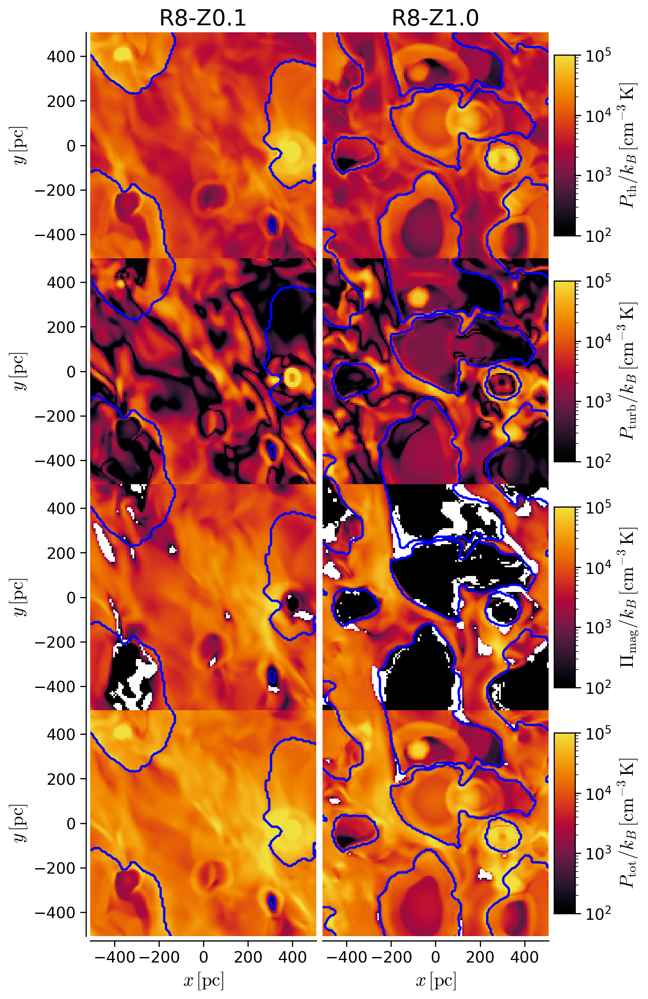

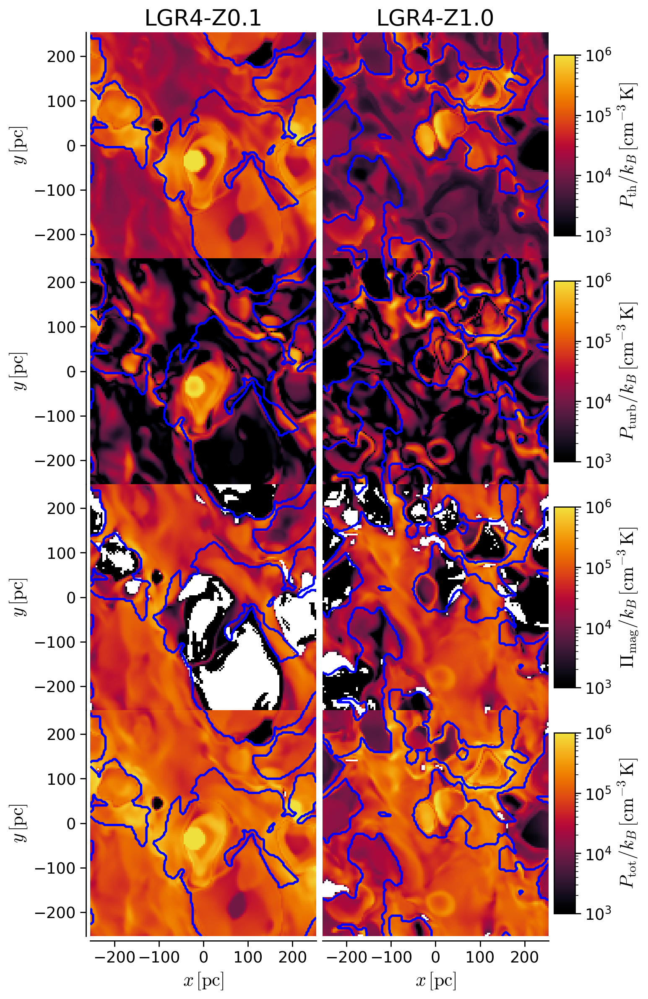

In [68]:
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    fields = ['Pth','Pturb','Pimag','Ptot']
    for f in fields:
        norm = LogNorm(1.e2,1.e5) if mgroup == 'R8' else LogNorm(1.e3,1.e6)
        plt_kwargs[f] = dict(norm = norm, cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    nfields = len(fields)
    fig,axes = plt.subplots(nfields,3,figsize=(7.5,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,0.1],
                                             wspace=0,hspace=0))

    for i,m,t,axes_ in zip(range(len(mlist[1::2])), mlist[1::2], tlist[::-1][1::2], axes[:,:-1].T):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(sp[sp['mage']<10]['x3'].mean())
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes_, axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            data = assign_phase(s,slcdata,kind='six')
            # levels = [0,1,2,3]
            # colors = [data.attrs["phdef"][i+1]['c'] for i in levels]
            # names =  [data.attrs["phdef"][i]['name'] for i in levels]
            levels = [2]
            colors = ["b"]
            plt.contour(data.x,data.y,data,levels=np.array(levels)+0.5,colors=colors)
            data = slcdata[f]
            im=plt.imshow(data,extent=extent,**plt_kwargs[f])

            if i == 1:
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=plt_kwargs[f]['label'])
                if f == 'phase':
                    cax.get_yaxis().set_ticks([])
                    for j, lab in enumerate(phlist):
                        color='w' if lab in ['CMM','CNM','UNM','WHIM','HIM'] else 'k'
                        cax.annotate(lab,(0.5,(2*j+1)/(2*nph)), xycoords='axes fraction',color=color,
                                     ha='center', va='center',fontsize=12, weight='bold')
        plt.sca(axes_[0])
        plt.title(s.name)

    tickloc = int(extent[1]/100)*100
    ticks = [-tickloc, 0, tickloc]
    ticks = [-400, -200, 0, 200, 400] if mgroup == 'R8' else [-200,-100,0,100,200]
    for ax in axes[:,0]:
        ax.axis('on')
        set_axis_color(ax,'x','none')
        ax.spines['right'].set_color('none')
        ax.spines['left'].set_position(('axes',-0.02))
        ax.yaxis.tick_left()
        ax.yaxis.set_label_position('left')
        ax.set_yticks(ticks)
        ax.set_ylabel(r'$y\,[{\rm pc}]$')
        # ax.tick_params(axis='y', rotation=20)
    for ax in axes[-1,:-1]:
        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        ax.set_xticks(ticks)
        ax.set_xlabel(r'$x\,[{\rm pc}]$')
        # ax.tick_params(axis='x', rotation=20)
    ax = axes[-1,0]
    set_axis_color(ax,'xy','k')
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')

    # adding arrow
    # import matplotlib.patches as mpatches
    # ax = axes[0,0]
    # bbox_props = dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2)
    # arr = mpatches.FancyBboxPatch((0.1,1.2), 4.7, 0.05, mutation_scale=0.1,
    #                               transform=ax.transAxes,
    #                               clip_on=False,
    #                                **bbox_props)
    # ax.add_patch(arr)
    # ax.annotate("Increasing Metallicity", (.5, .5), xycoords=arr, ha='center', va='center')
    fig.savefig(os.path.join(pdata.outdir,'{}_Pmaps_contour.png'.format(mgroup)),bbox_inches='tight')

In [21]:
for f in fields:
    s.bins[f] = s.bins["pok"]

In [22]:
from pyathena.tigress_ncr.phase import recal_nP

In [23]:
Plabels["nH"]="$n_{\rm H}$"
Plabels["T"]="$T$"

In [25]:
def draw_nP(slcdata,xf="nH",yf="Pth",Nx=151,Ny=125):
    pdf_dset=recal_nP(slcdata,xf=xf,yf=yf,Nx=Nx,Ny=Ny)
    cbar_kwargs=dict(shrink=0.8,orientation='horizontal',location='top')
    wf = 'vol'
    pdf = pdf_dset[f"all-{wf}"]
    xbins = pdf['n_H' if xf == "nH" else xf]
    ybins = pdf[yf]
    dx = xbins[1]-xbins[0]
    dy = ybins[1]-ybins[0]
    # print(dx,dy)
    total = pdf_dset[wf].data
    cmap = cmr.dusk
    norm = LogNorm(1.e-3,10)
    im=plt.pcolormesh(xbins,ybins,pdf/total,norm=norm,cmap=cmap,shading='nearest')
    # cbar=plt.colorbar(im,pad=0.01,**cbar_kwargs)
    # cbar.set_label(r'$\frac{{d^2f_V(z=0)}}{{d\,\log {}\,d\,\log {}/k_B}}\,[{{\rm dex^{{-2}}}}]$'.format(Plabels[xf],Plabels[yf][1:-1]),labelpad=15)
    if xf=="nH":
        plt.xlim(-4,4)
    elif xf=="T":
        plt.xlim(1,8)
    plt.ylim(1,7)
    return im

-0.6238543910364951


22.509580122927826
-21.297654172648553
35.23376323779424
14.727156059308486
-15.867127808517424
-15.498974908481944
-6.120971989631653
-30.934252344071865
10.920726422220469


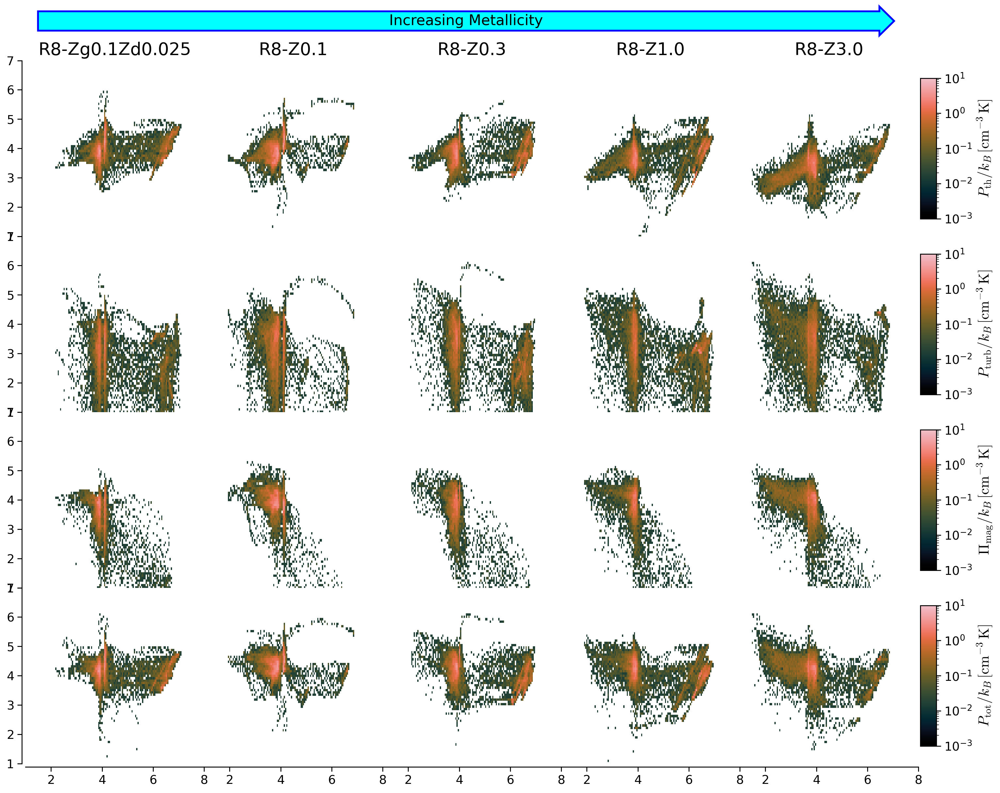

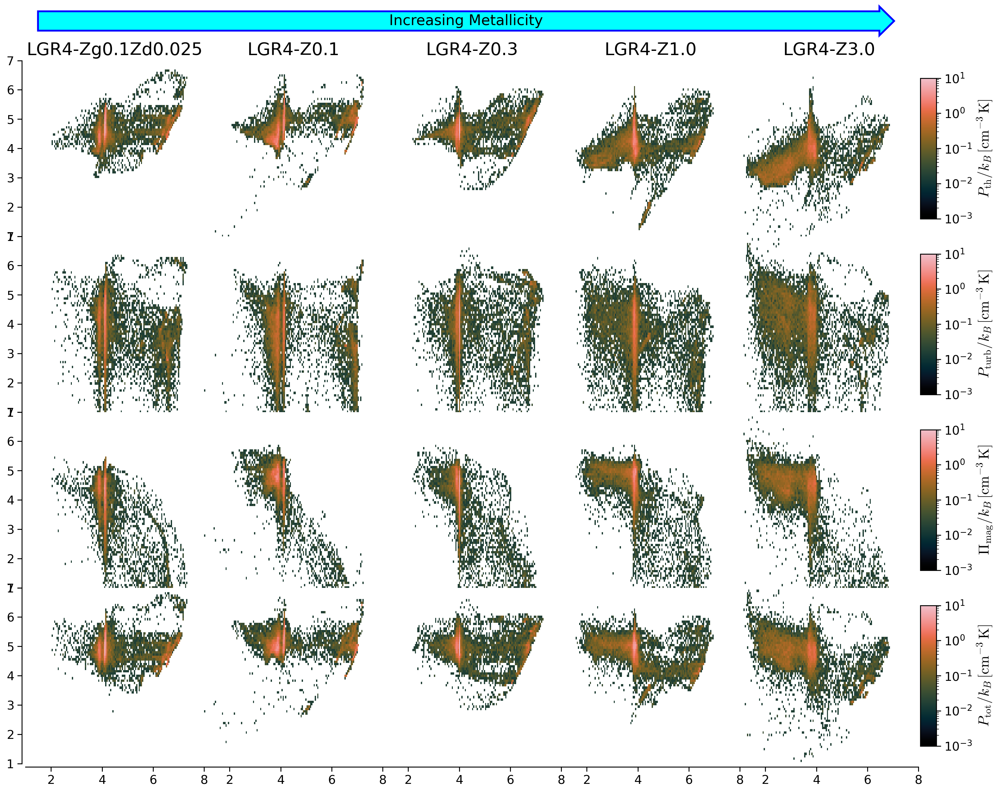

In [26]:
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    for f in dfi:
        plt_kwargs[f] = dict(norm = dfi[f]['norm'], cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    fields = ['Pth','Pturb','Pimag','Ptot']
    nfields = len(fields)
    fig,axes = plt.subplots(nfields,6,figsize=(18,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,1,1,1,0.1],
                                             wspace=0,hspace=0))

    for i,m,t,axes_ in zip(range(len(mlist)), mlist, tlist[::-1], axes[:,:-1].T):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(sp[sp['mage']<10]['x3'].mean())
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes_, axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            im = draw_nP(slcdata,xf="T",yf=f)

            if i == (len(mlist)-1):
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=plt_kwargs[f]['label'])

        plt.sca(axes_[0])
        plt.title(s.name)

    # tickloc = int(extent[1]/100)*100
    # ticks = [-tickloc, 0, tickloc]
    # ticks = [-400, -200, 0, 200, 400] if mgroup == 'R8' else [-200,-100,0,100,200]
    for ax in axes[:,0]:
        ax.axis('on')
        set_axis_color(ax,'x','none')
        ax.spines['right'].set_color('none')
        ax.spines['left'].set_position(('axes',-0.02))
        ax.yaxis.tick_left()
        ax.yaxis.set_label_position('left')
        # ax.set_yticks(ticks)
        # ax.set_ylabel(r'$y\,[{\rm pc}]$')
        # ax.tick_params(axis='y', rotation=20)
    for ax in axes[-1,:-1]:
        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        # ax.set_xticks(ticks)
        # ax.set_xlabel(r'$x\,[{\rm pc}]$')
        # ax.tick_params(axis='x', rotation=20)
    ax = axes[-1,0]
    set_axis_color(ax,'xy','k')
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')

    # adding arrow
    import matplotlib.patches as mpatches
    ax = axes[0,0]
    bbox_props = dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2)
    arr = mpatches.FancyBboxPatch((0.1,1.2), 4.7, 0.05, mutation_scale=0.1,
                                  transform=ax.transAxes,
                                  clip_on=False,
                                   **bbox_props)
    ax.add_patch(arr)
    ax.annotate("Increasing Metallicity", (.5, .5), xycoords=arr, ha='center', va='center')
    fig.savefig(os.path.join(pdata.outdir,'{}_TPpdf.png'.format(mgroup)),bbox_inches='tight')

0 R8_8pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy4096.eps0.0 448
1 R8_8pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy2048.eps0.0 387
2 LGR4_4pc_NCR.full.b1.v3.iCR4.Zg0.1.Zd0.1.xy2048.eps1.e-8 341
3 LGR4_4pc_NCR.full.b1.v3.iCR4.Zg1.Zd1.xy1024.eps1.e-8 238


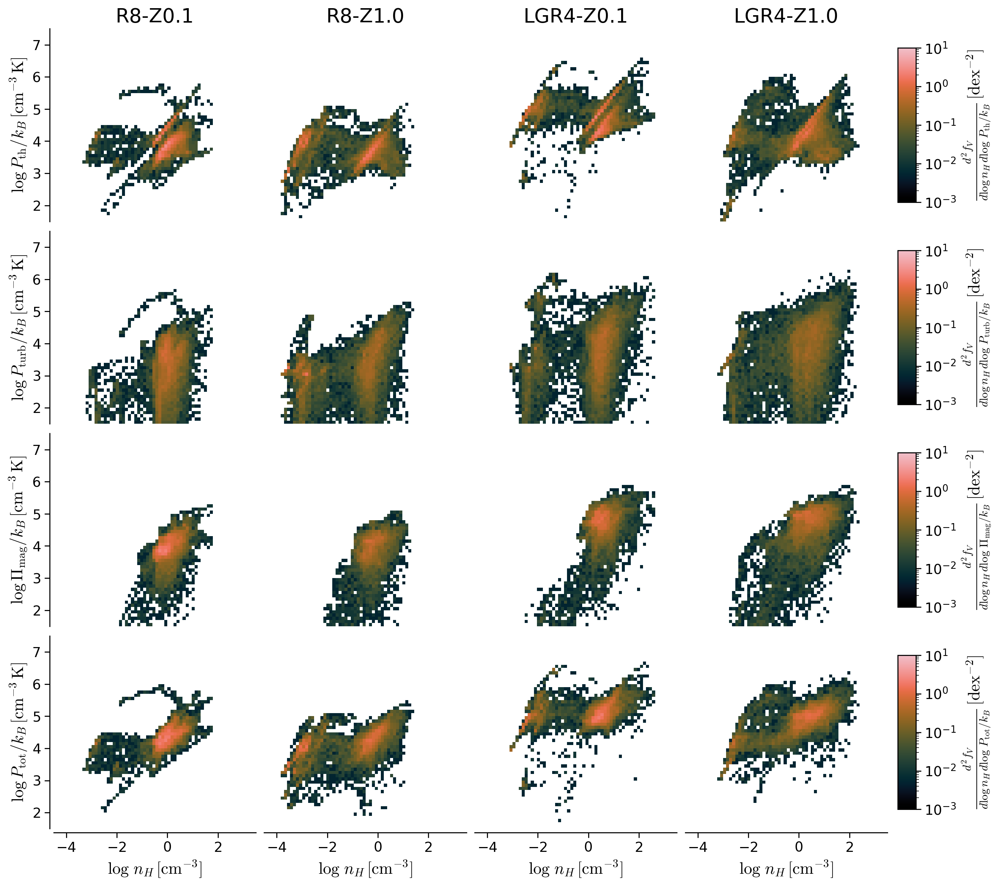

In [56]:
fields = ['Pth','Pturb','Pimag','Ptot']
nfields = len(fields)

fig,axes = plt.subplots(nfields,5,figsize=(15,3.5*nfields),
                            gridspec_kw=dict(width_ratios=[1,1,1,1,0.1],
                                             wspace=0.05,hspace=0.05))
i=0
for mgroup in ['R8','LGR4']:
    mlist = pdata.mgroup[mgroup]
    mlist = sorted(mlist)
    if mgroup == 'LGR4':
        tlist = [293,238,300,341,284]
        tfactor = 2
    elif mgroup == 'R8':
        tlist = [463,387,429,448,438]
        tfactor = 1
    plt_kwargs=dict()
    for f in dfi:
        plt_kwargs[f] = dict(norm = dfi[f]['norm'], cmap = dfi[f]['cmap'], label = dfi[f]['cbar_kwargs']['label'])

    for m,t in zip(mlist[1::2], tlist[::-1][1::2]):
        s = pdata.sa.set_model(m)
        slcdata = athena_data(s,s.read_slc_xarray(t*tfactor,fields=None,axis='z'))
        slc=slcdata.data
        s.name = pdata.get_model_name(s,beta=False)
        sp = s.load_starpar_vtk(t*tfactor,force_override=True)
        print(i,m,t)
        extent = [slc.x.min(),slc.x.max(),slc.y.min(),slc.y.max()]
        for ax, cax, f in zip(axes[:,i], axes[:,-1], fields):
            plt.sca(ax)
            ax.axis('off')
            im = draw_nP(slcdata,xf="nH",yf=f,Nx=101,Ny=101)
            plt.xlim(-4.5,3.5)
            plt.ylim(1.5,7.5)
            if i == 3:
                bbox = cax.get_position()
                newbbox = bbox.from_bounds(bbox.x0+bbox.width*0.1,bbox.y0+bbox.height*0.1,
                                           bbox.width*(2 if f=='phase' else 0.9),bbox.height*0.8)
                cax.set_position(newbbox)
                plt.colorbar(im,cax=cax,label=f'$\\frac{{d^2 f_V}}{{d\log n_{{H}}\,d\log\,{Plabels[f][1:-1]}/k_B}}\,[{{\\rm dex^{{-2}}}}]$')#\\,[{{\\rm dex^{{-2}}}}]$')

        plt.sca(axes[0,i])
        plt.title(s.name)

        ax.axis('on')
        set_axis_color(ax,'y','none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_position(('axes',-0.02))
        ax.xaxis.tick_bottom()
        ax.xaxis.set_label_position('bottom')
        ax.set_xlabel(r'$\log\,n_H\,[{\rm cm^{-3}}]$')
        i+=1
    # adding arrow

for ax,f in zip(axes[:,0],fields):
    ax.axis('on')
    set_axis_color(ax,'x','none')
    ax.spines['right'].set_color('none')
    ax.spines['left'].set_position(('axes',-0.02))
    ax.yaxis.tick_left()
    ax.yaxis.set_label_position('left')
    ax.set_ylabel(r'$\log$'+plt_kwargs[f]['label'])
set_axis_color(ax,'xy','k')
ax.spines['top'].set_color('none')
ax.spines['right'].set_color('none')
fig.savefig(os.path.join(pdata.outdir,'nP_all.png'),bbox_inches='tight')
